## Applying Manifold Learning Method

### Dataset creation for S-Shaped and Swiss Roll

In [1]:
import matplotlib.pyplot as plt
from matplotlib import ticker

# unused but required import for doing 3d projections with matplotlib < 3.2
import mpl_toolkits.mplot3d  # noqa: F401

from sklearn import manifold, datasets

n_samples = 2000

# S-Shaped Dataset
S_Shaped_points, S_Shaped_color = datasets.make_s_curve(n_samples, random_state=0)

# Swiss ROll Dataset
Swiss_Roll_points, Swiss_Roll_color = datasets.make_swiss_roll(n_samples, noise=0.2, random_state=0)

### S-Shape and Swiss Roll Visualization

In [2]:
def plot_3d(points, points_color, title):
    """
    Function to plot 3D visualization of S-Shaped Dataset and Swiss Roll Dataset
    """
    x, y, z = points.T

    fig, ax = plt.subplots(
        figsize=(6, 6),
        facecolor="white",
        tight_layout=True,
        subplot_kw={"projection": "3d"},
    )
    fig.suptitle(title, size=16)
    col = ax.scatter(x, y, z, c=points_color, s=50, alpha=0.8)
    ax.view_init(azim=-60, elev=9)
    ax.xaxis.set_major_locator(ticker.MultipleLocator(1))
    ax.yaxis.set_major_locator(ticker.MultipleLocator(1))
    ax.zaxis.set_major_locator(ticker.MultipleLocator(1))

    fig.colorbar(col, ax=ax, orientation="horizontal", shrink=0.6, aspect=60, pad=0.01)
    plt.show()

In [3]:
def plot_2d(points, points_color, title):
    """
    Function to plot 2D visualization
    """
    fig, ax = plt.subplots(figsize=(3, 3), facecolor="white", constrained_layout=True)
    fig.suptitle(title, size=16)
    add_2d_scatter(ax, points, points_color)
    plt.show()


def add_2d_scatter(ax, points, points_color, title=None):
    x, y = points.T
    ax.scatter(x, y, c=points_color, s=50, alpha=0.8)
    ax.set_title(title)
    ax.xaxis.set_major_formatter(ticker.NullFormatter())
    ax.yaxis.set_major_formatter(ticker.NullFormatter())

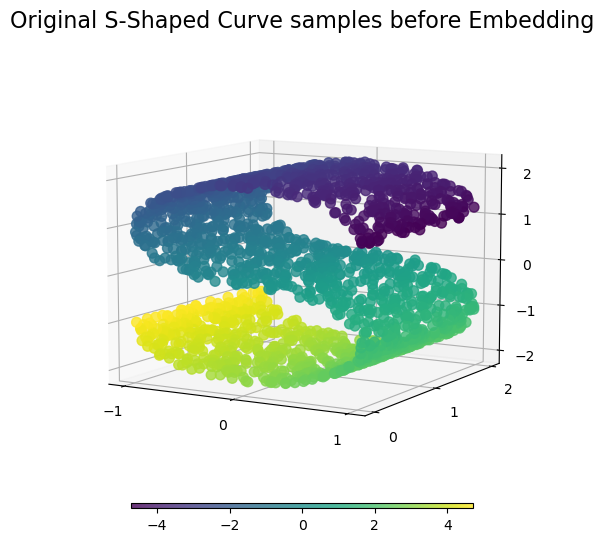

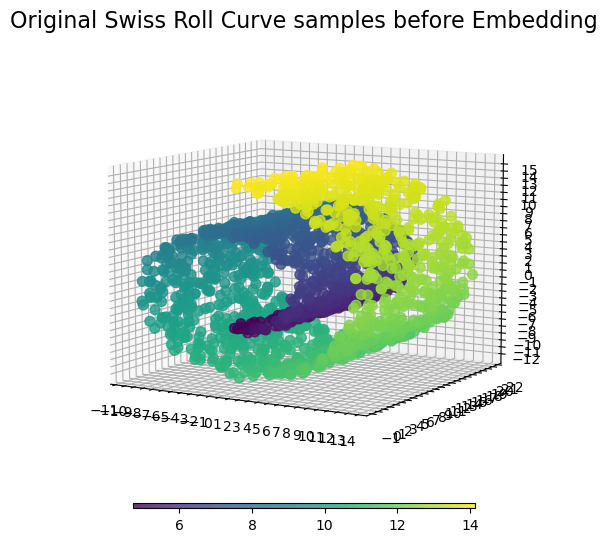

In [4]:
# S-Shaped Visualization
plot_3d(S_Shaped_points, S_Shaped_color, "Original S-Shaped Curve samples before Embedding")

# Swiss Roll Visualization
plot_3d(Swiss_Roll_points, Swiss_Roll_color, "Original Swiss Roll Curve samples before Embedding")

## Isomap, Laplacian eigenmaps and Locally Linear Embedding Visualization for S-Shaped Dataset after Embedding

In [5]:
# Neighbourhood which is used to recover the locally linear structure
n_neighbors = 10

# Number of co-ordinates for the manifold
n_components = 2

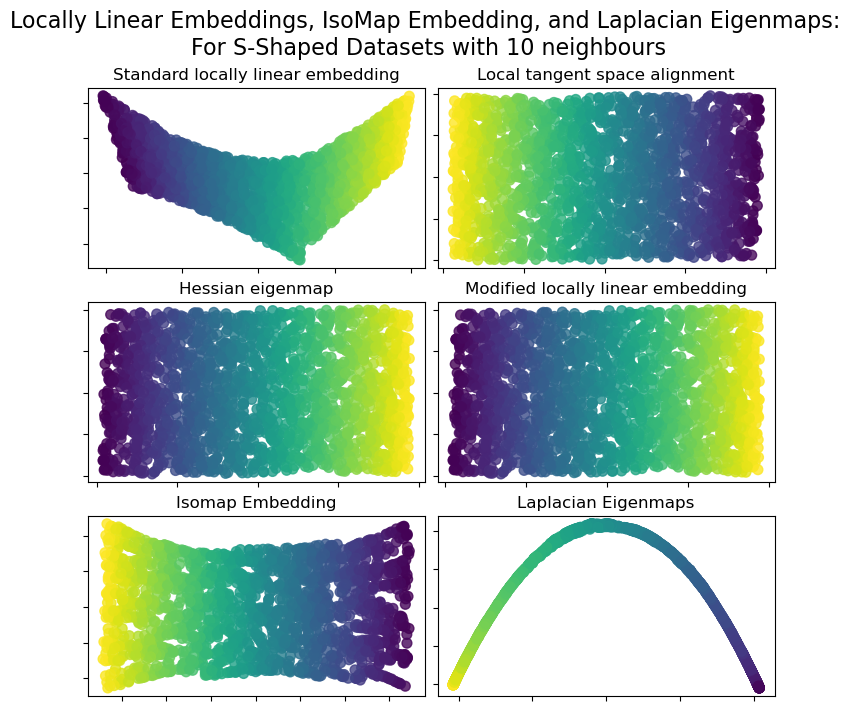

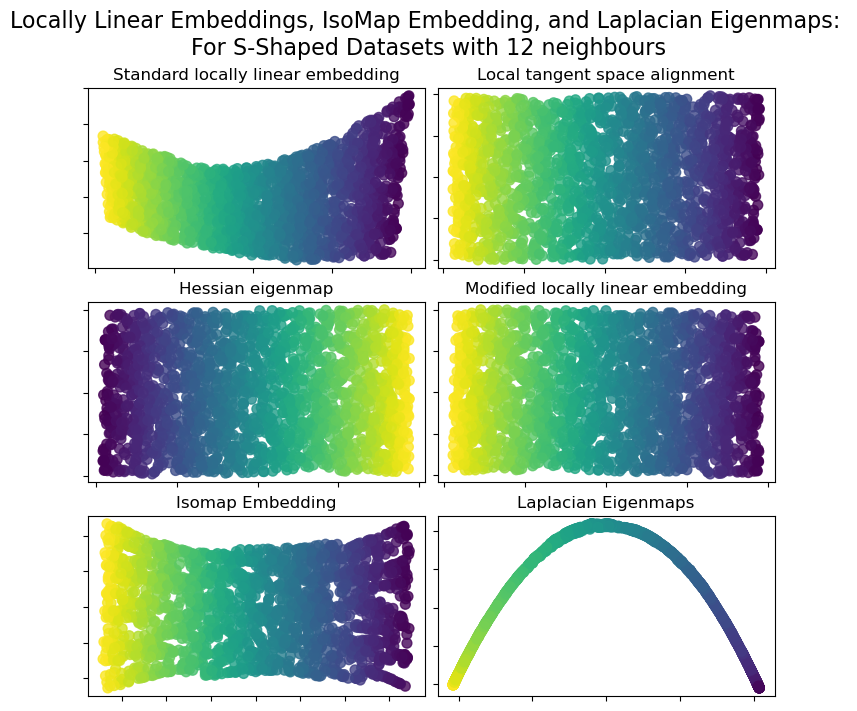

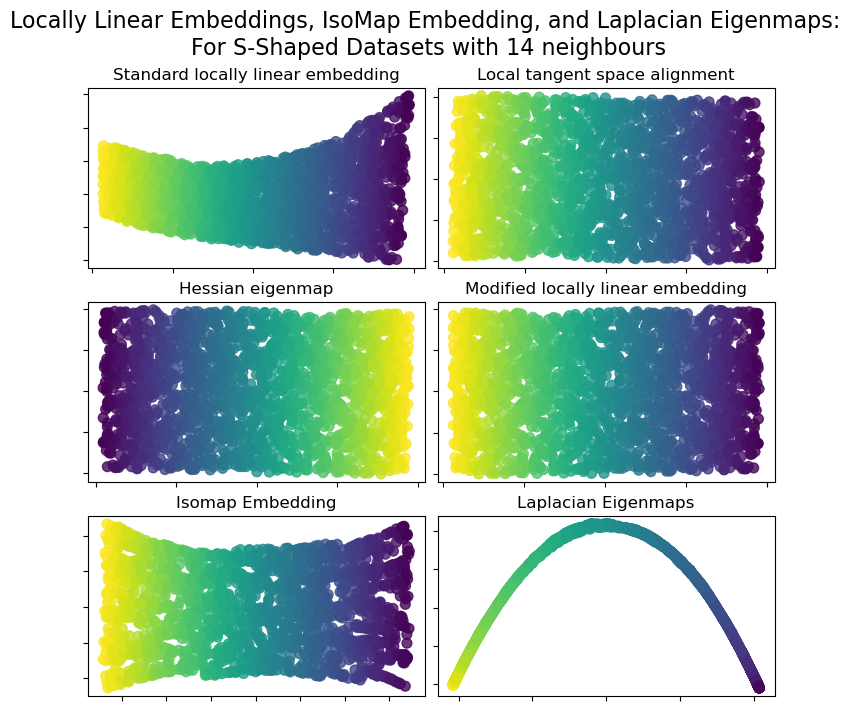

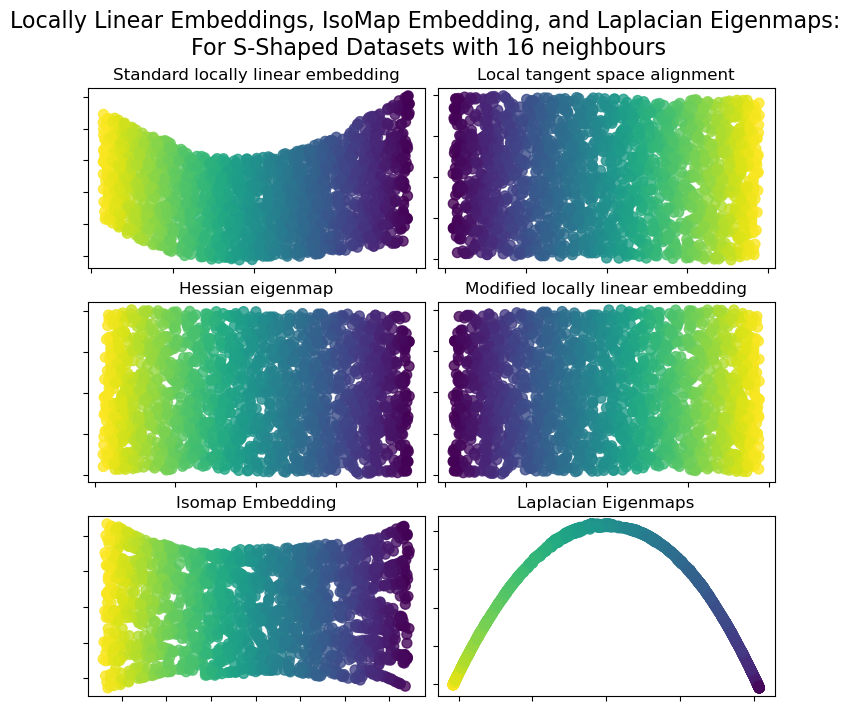

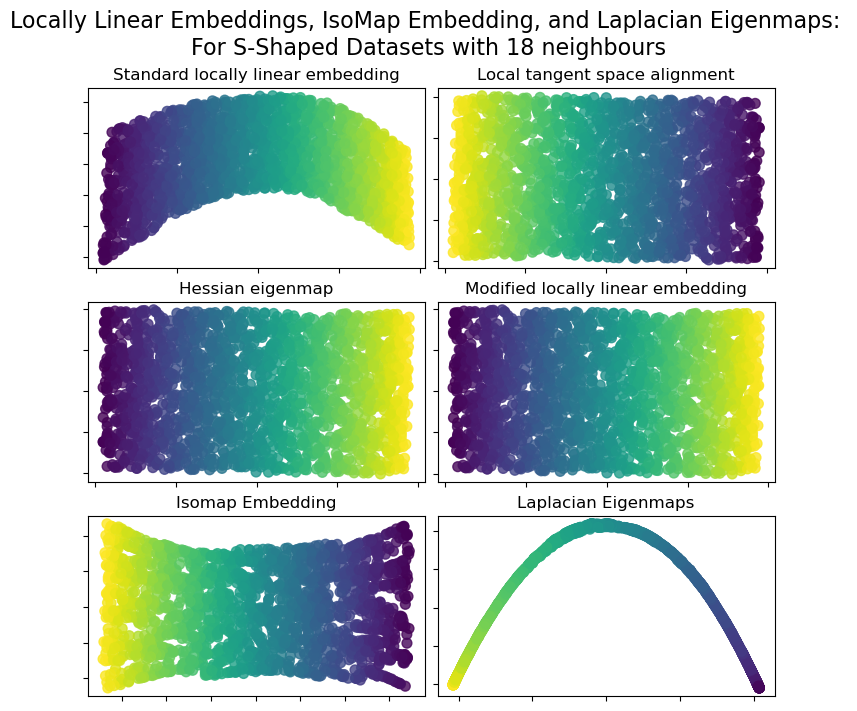

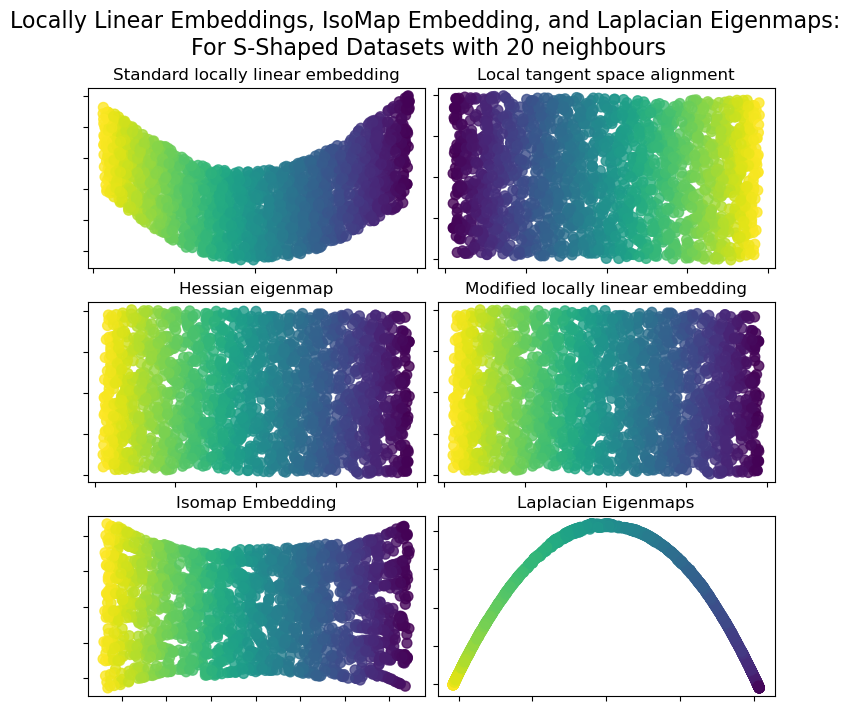

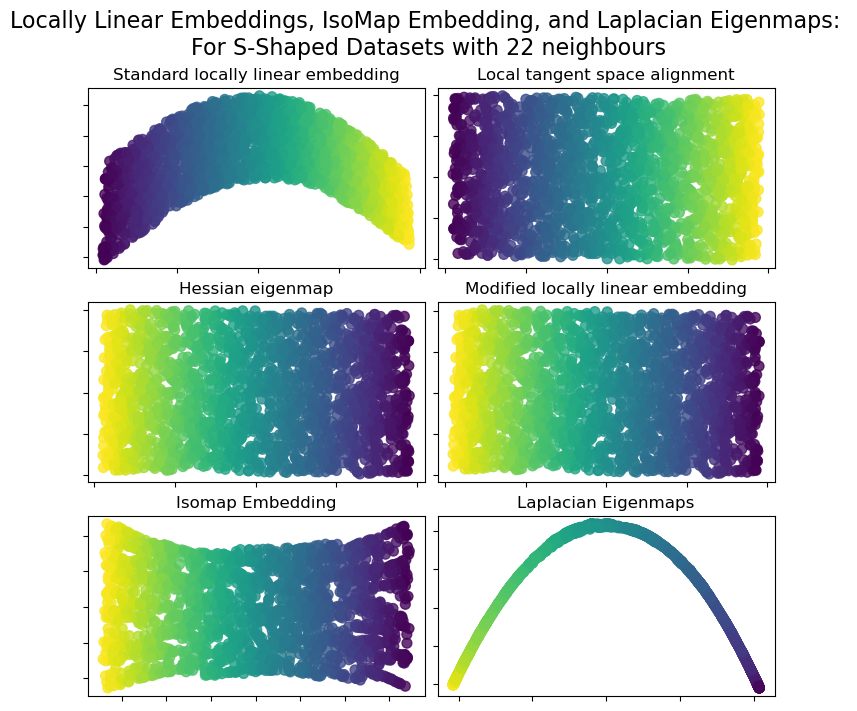

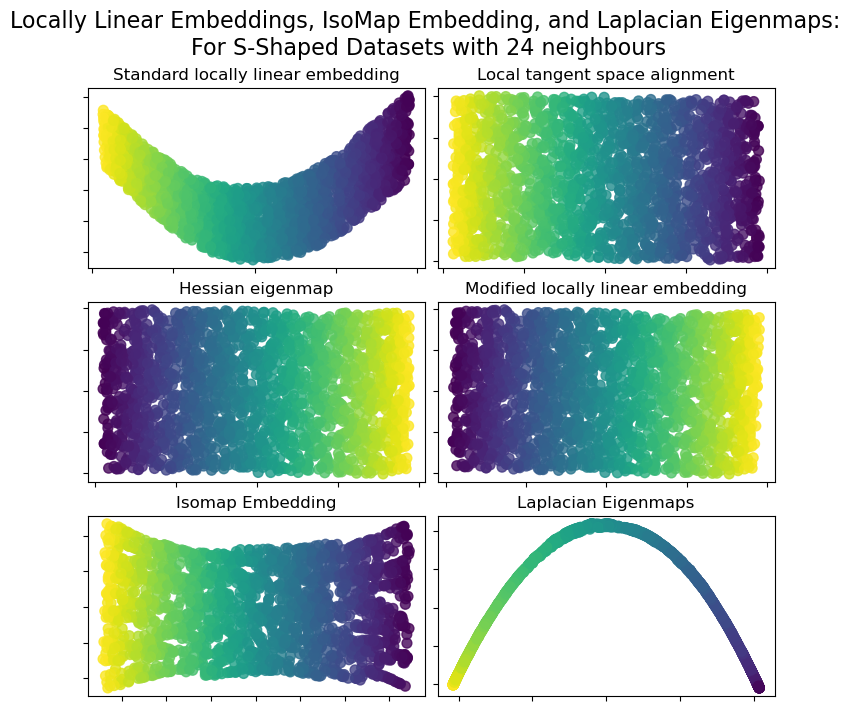

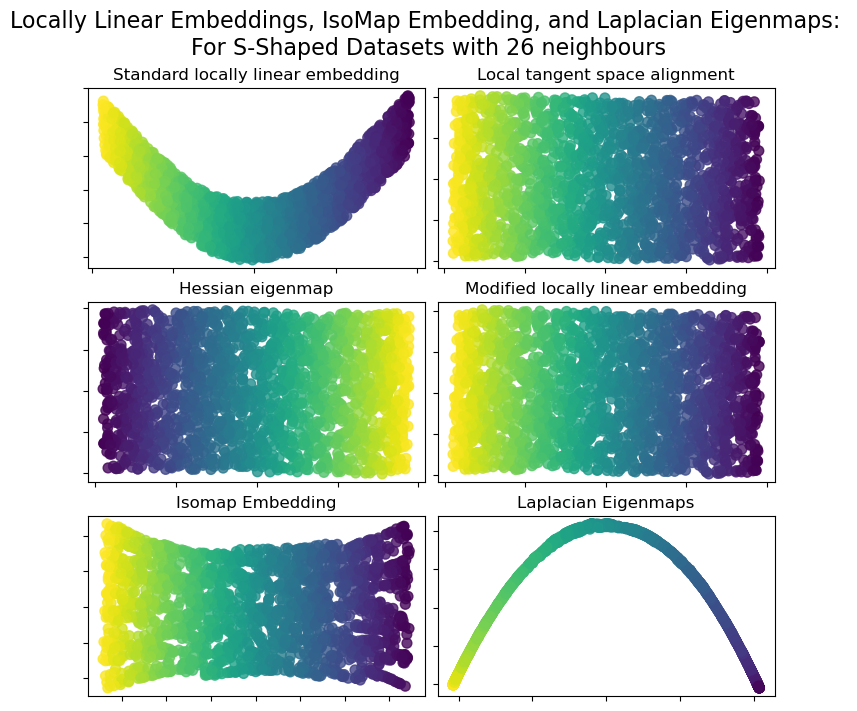

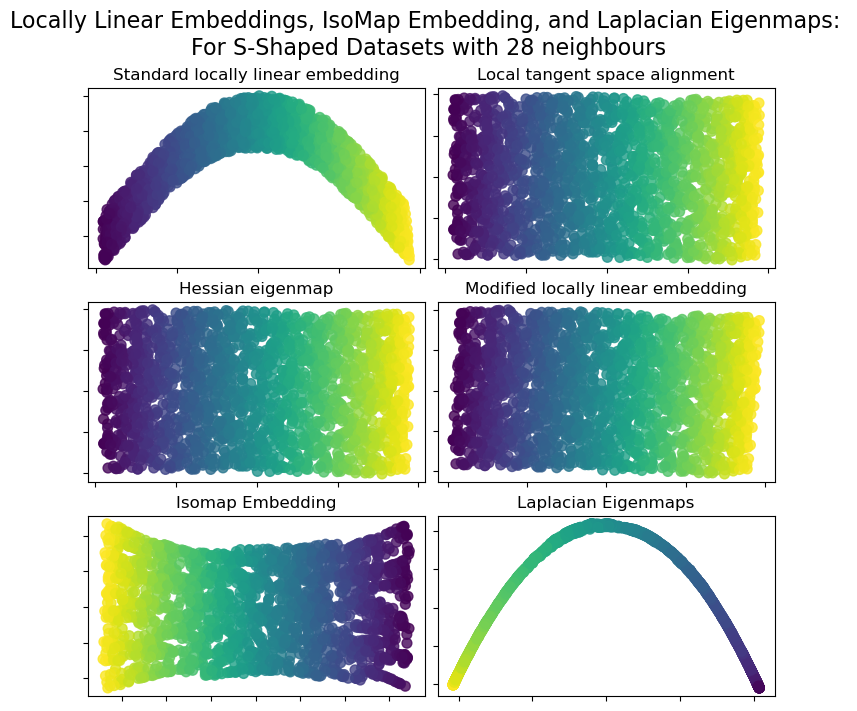

In [6]:
params = {
    "n_neighbors": n_neighbors,
    "n_components": n_components,
    "eigen_solver": "auto",
    "random_state": 0,
}

for i in range(10,30, 2):
    params['n_neighbors'] = i

    # Manifold Clustering for S-Shaped Dataset
    # Locally Linear Embedding Algorithm
    # Using Standard method
    lle_standard = manifold.LocallyLinearEmbedding(method="standard", **params)
    S_Shaped_standard = lle_standard.fit_transform(S_Shaped_points)

    # Using LTSA(Local tangent space alignment) method 
    lle_ltsa = manifold.LocallyLinearEmbedding(method="ltsa", **params)
    S_Shaped_ltsa = lle_ltsa.fit_transform(S_Shaped_points)

    # Using Hessian eigenmap method
    lle_hessian = manifold.LocallyLinearEmbedding(method="hessian", **params)
    S_Shaped_hessian = lle_hessian.fit_transform(S_Shaped_points)

    # Using Modified locally linear embedding method
    lle_mod = manifold.LocallyLinearEmbedding(method="modified", **params)
    S_Shaped_mod = lle_mod.fit_transform(S_Shaped_points)

    # Isomap Clustering
    isomap = manifold.Isomap(n_neighbors=n_neighbors, n_components=n_components, p=1)
    S_Shaped_isomap = isomap.fit_transform(S_Shaped_points)

    # Spectral Embedding (It uses Laplacian Eigenmaps)
    spectral = manifold.SpectralEmbedding(n_components=n_components, n_neighbors=n_neighbors)
    S_Shaped_spectral = spectral.fit_transform(S_Shaped_points)
    
    fig, axs = plt.subplots(
    nrows=3, ncols=2, figsize=(7, 7), facecolor="white", constrained_layout=True)
    
    fig.suptitle("Locally Linear Embeddings, IsoMap Embedding, and Laplacian Eigenmaps: \nFor S-Shaped Datasets with {} neighbours".format(params['n_neighbors']), size=16)
    
    lle_methods = [
        ("Standard locally linear embedding", S_Shaped_standard),
        ("Local tangent space alignment", S_Shaped_ltsa),
        ("Hessian eigenmap", S_Shaped_hessian),
        ("Modified locally linear embedding", S_Shaped_mod),
        ("Isomap Embedding", S_Shaped_isomap),
        ("Laplacian Eigenmaps", S_Shaped_spectral),
    ]
    for ax, method in zip(axs.flat, lle_methods):
        name, points = method
        add_2d_scatter(ax, points, S_Shaped_color, name)


    plt.show()
    
    # save the plot to a file in PNG format
    fig.savefig('./Que6_DatasetsPlots/que6S_Shaped{}.png'.format(params['n_neighbors']))

## Isomap, Laplacian eigenmaps and Locally Linear Embedding Visualization for Swiss Roll Dataset after Embedding

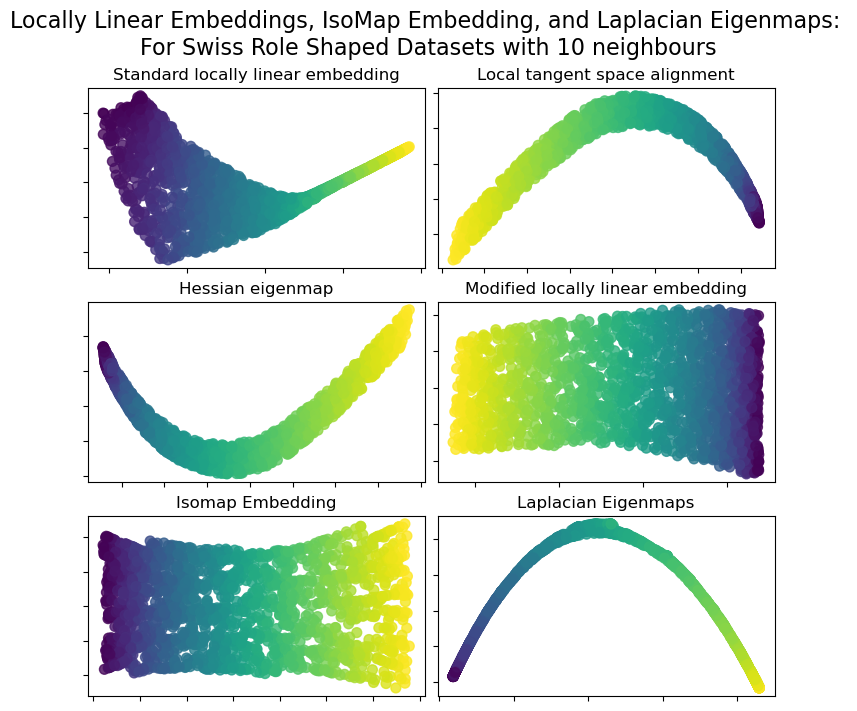

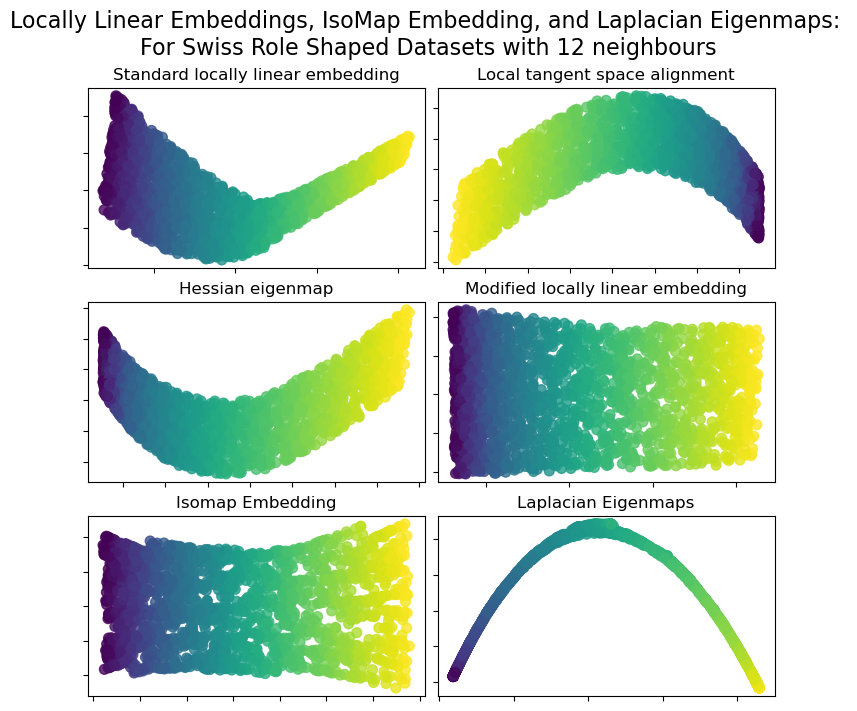

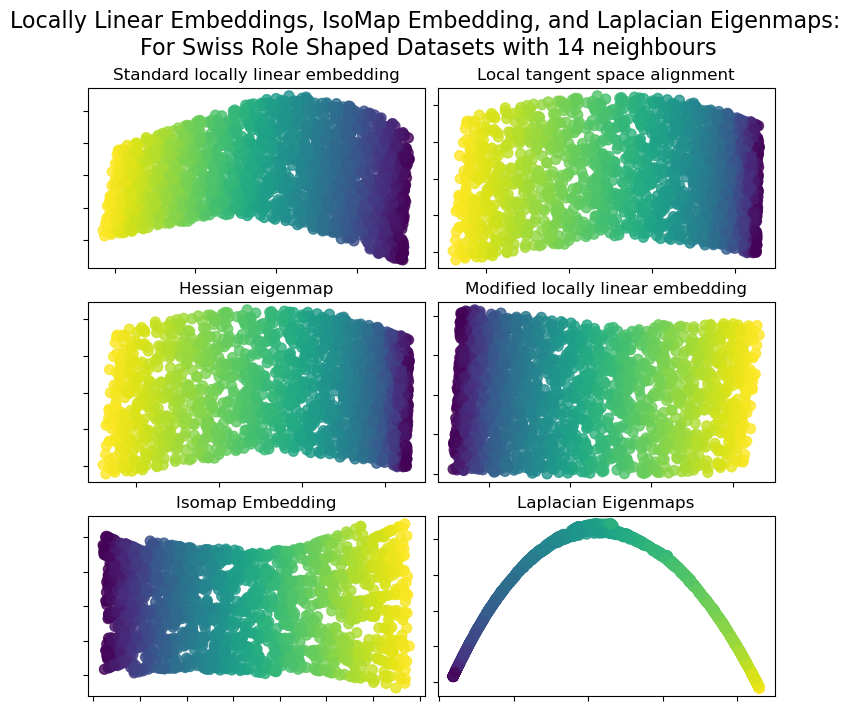

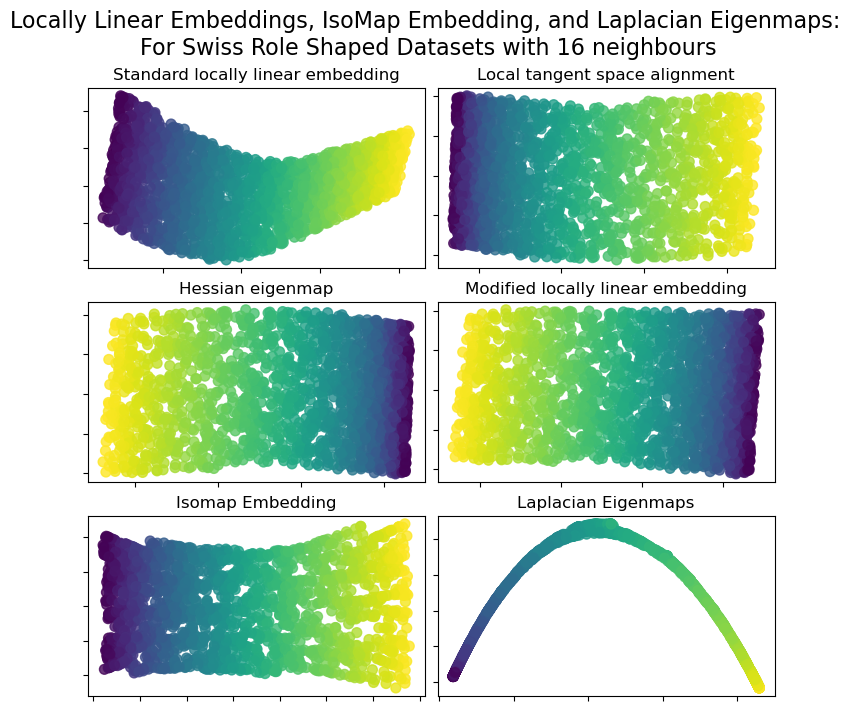

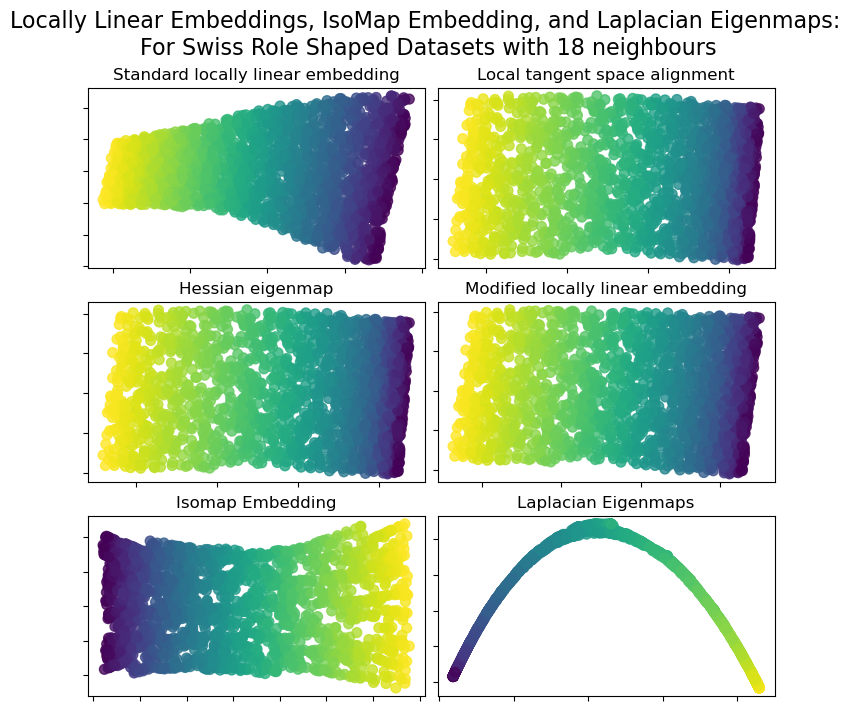

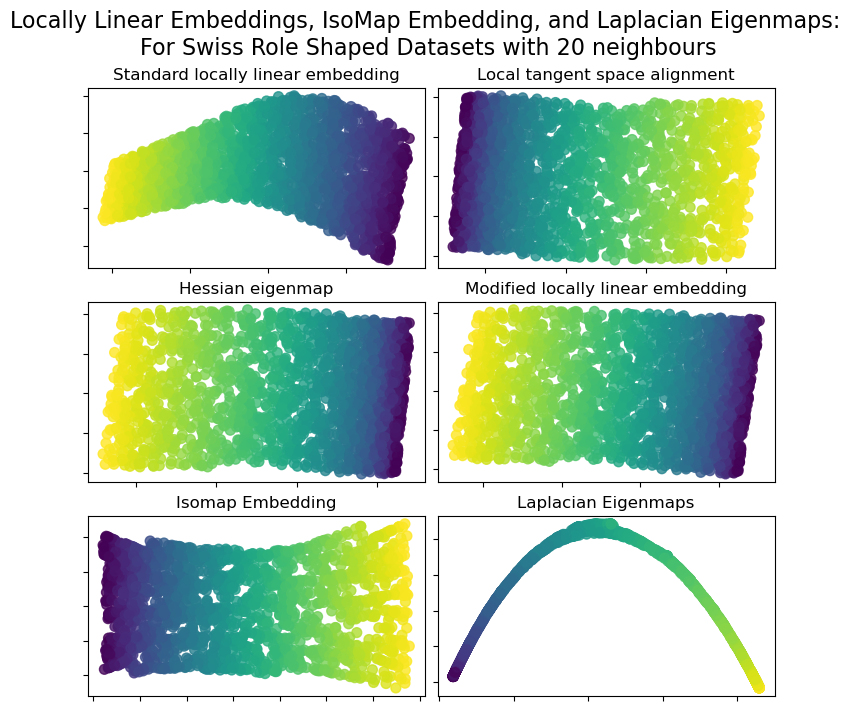

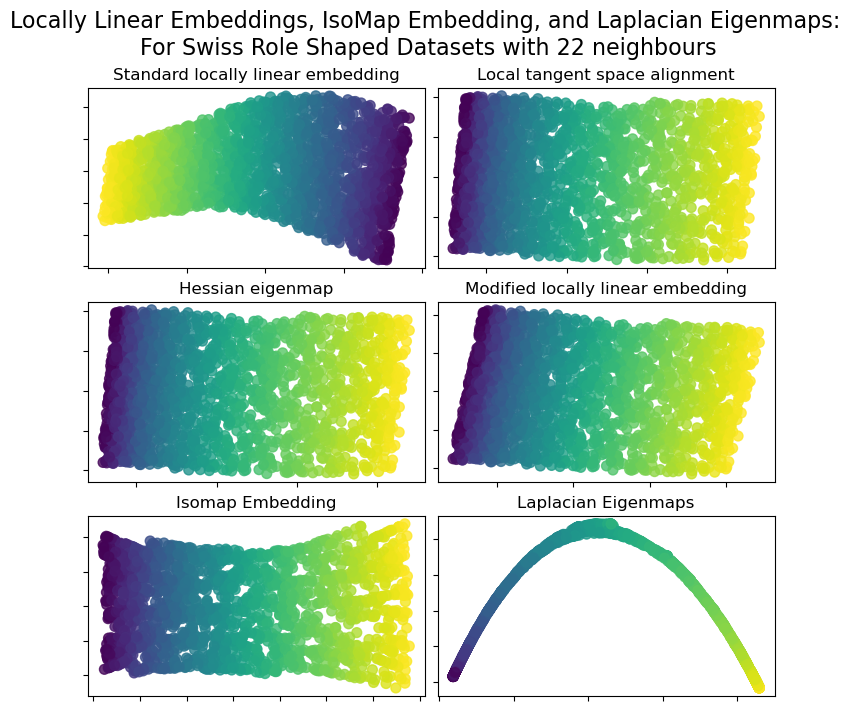

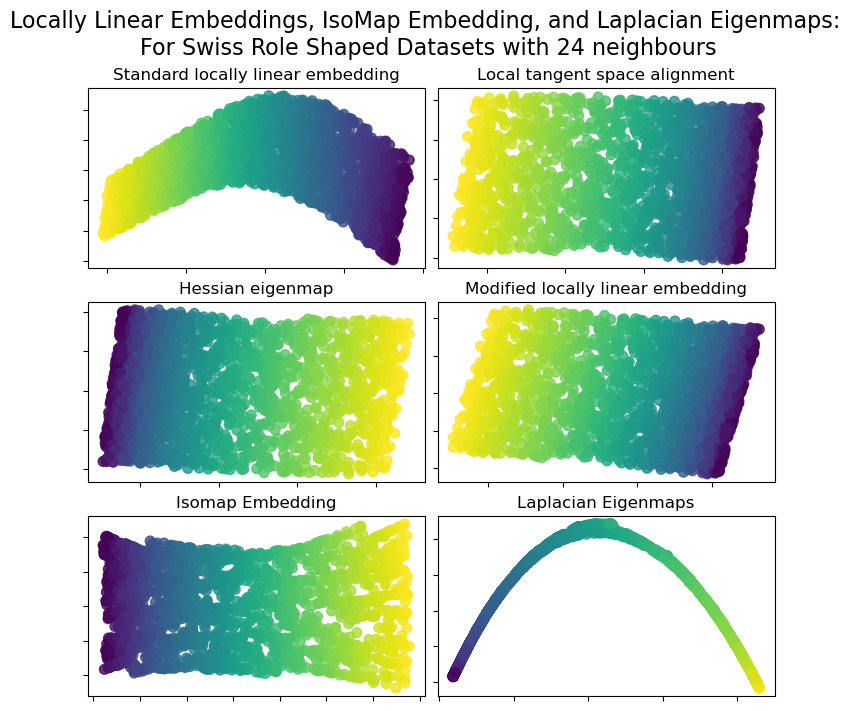

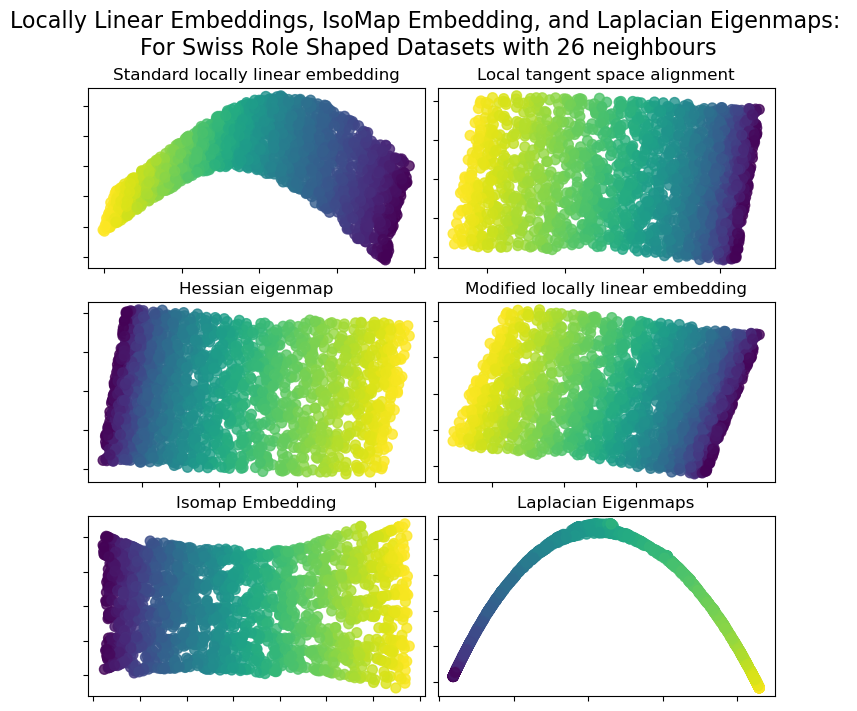

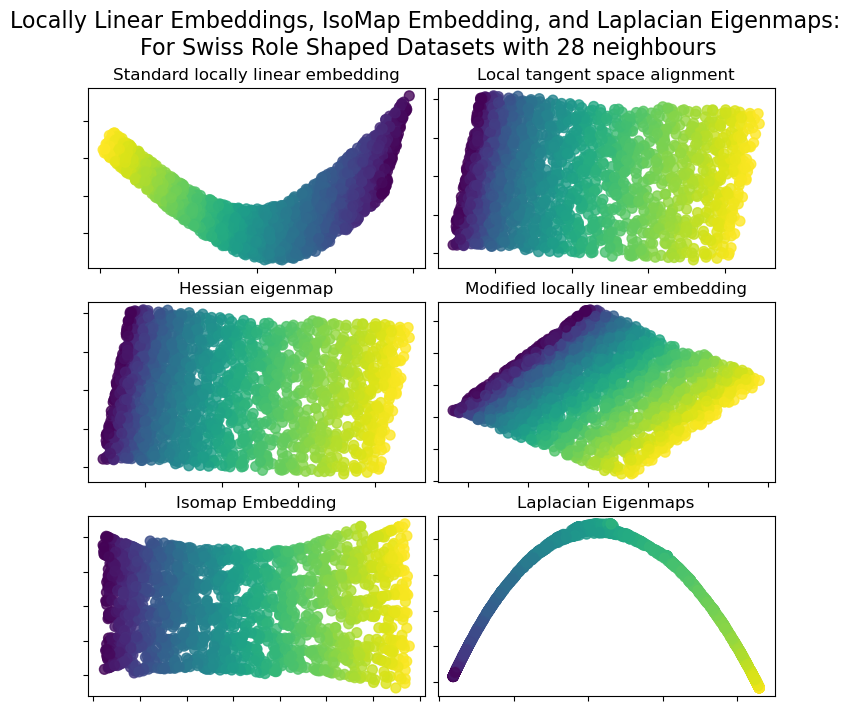

In [7]:
params = {
    "n_neighbors": n_neighbors,
    "n_components": n_components,
    "eigen_solver": "auto",
    "random_state": 0,
}

for i in range(10,30, 2):
    params['n_neighbors'] = i

    # Manifold Clustering for Swiss Roll Dataset
    # Locally Linear Embedding Algorithm
    # Using Standard method
    lle_standard = manifold.LocallyLinearEmbedding(method="standard", **params)
    Swiss_Roll_standard = lle_standard.fit_transform(Swiss_Roll_points)

    # Using LTSA(Local tangent space alignment) method 
    lle_ltsa = manifold.LocallyLinearEmbedding(method="ltsa", **params)
    Swiss_Roll_ltsa = lle_ltsa.fit_transform(Swiss_Roll_points)

    # Using Hessian eigenmap method 
    lle_hessian = manifold.LocallyLinearEmbedding(method="hessian", **params)
    Swiss_Roll_hessian = lle_hessian.fit_transform(Swiss_Roll_points)

    # Using Modified locally linear embedding method 
    lle_mod = manifold.LocallyLinearEmbedding(method="modified", **params)
    Swiss_Roll_mod = lle_mod.fit_transform(Swiss_Roll_points)

    # Using Isomap Embedding method 
    isomap = manifold.Isomap(n_neighbors=n_neighbors, n_components=n_components, p=1)
    Swiss_Roll_isomap = isomap.fit_transform(Swiss_Roll_points)

    # Using Spectral Clustering (it uses Laplacian Eigenmaps method) method 
    spectral = manifold.SpectralEmbedding(n_components=n_components, n_neighbors=n_neighbors)
    Swiss_Roll_spectral = spectral.fit_transform(Swiss_Roll_points)
    
    fig, axs = plt.subplots(
    nrows=3, ncols=2, figsize=(7, 7), facecolor="white", constrained_layout=True)
    
    fig.suptitle("Locally Linear Embeddings, IsoMap Embedding, and Laplacian Eigenmaps: \nFor Swiss Role Shaped Datasets with {} neighbours".format(params['n_neighbors']), size=16)
    
    lle_methods = [
        ("Standard locally linear embedding", Swiss_Roll_standard),
        ("Local tangent space alignment", Swiss_Roll_ltsa),
        ("Hessian eigenmap", Swiss_Roll_hessian),
        ("Modified locally linear embedding", Swiss_Roll_mod),
        ("Isomap Embedding", Swiss_Roll_isomap),
        ("Laplacian Eigenmaps", Swiss_Roll_spectral),
    ]
    for ax, method in zip(axs.flat, lle_methods):
        name, points = method
        add_2d_scatter(ax, points, Swiss_Roll_color, name)


    plt.show()
    
    # save the plot to a file in PNG format
    fig.savefig('./Que6_DatasetsPlots/que6Swiss_Roll{}.png'.format(params['n_neighbors']))